# imports

In [2]:
import anndata as ad
import scanpy as sc
import numpy as np
import seaborn as sns
import palettable
import pandas as pd
import scipy.io as sio
import pickle
import sys
import scipy
sys.path.append('/home/yzy/bioSIMS/code/analysis')
from utils_220 import *
# sc.set_figure_params(dpi=500, color_map='viridis')
sc.set_figure_params(dpi=500, color_map='viridis',dpi_save=500,transparent=True)

sc.settings.verbosity = 2
heatmap_cmp = palettable.cmocean.diverging.Balance_20.mpl_colormap

# %matplotlib inline


Using TensorFlow backend.
/home/yzy/anaconda3/envs/scaden/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.cluster.bicluster module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.cluster. Anything that cannot be imported from sklearn.cluster is now part of the private API.
  warnings.warn(message, FutureWarning)


# functions

# data loading

In [13]:
R2_dump = 'fig4_rep0_cls6_reorder_full.h5ad'
R1_dump = 'fig4_rep1_cls6_full_adddist.h5ad'
R4_dump = 'fig4_rep2_cls6_reorder_full.h5ad'
R3_dump = 'fig4_rep3_cls6_reorder_full.h5ad'
m_dump = 'figures/Fig2_dump_data/fig2_c8.h5ad'



a_R1 = ad.read_h5ad('/home/yzy/ipynbs/figures/Fig4_dump_data/'+R1_dump)
a_R2 = ad.read_h5ad('/home/yzy/ipynbs/figures/Fig4_dump_data/'+R2_dump)
a_R3 = ad.read_h5ad('/home/yzy/ipynbs/figures/Fig4_dump_data/'+R3_dump)
a_R4 = ad.read_h5ad('/home/yzy/ipynbs/figures/Fig4_dump_data/'+R4_dump)
a_m = ad.read_h5ad(m_dump)

In [14]:
a_R2.obs['final_cls'] = a_R2.obs['cls_5_reorder']
a_R1.obs['final_cls'] = a_R1.obs['cls_5_pca_reorder']
a_R4.obs['final_cls'] = a_R4.obs['cls_5_reorder']
a_R3.obs['final_cls'] = a_R3.obs['cls_6_bak_reorder']
a_m.obs['final_cls'] = a_m.obs['cls_8_reorder']

rep3_cls = np.array(a_R3.obs['cls_6_bak_reorder'].copy())
rep3_cls_tmp = rep3_cls.copy()
rep3_cls[rep3_cls_tmp=='4']='5'
rep3_cls[rep3_cls_tmp=='5']='4'


a_R3.obs['final_cls'] = rep3_cls
a_R3.obs['final_cls'] = a_R3.obs['final_cls'].astype('category')
cls_cmp = ['#006FFF','#13F4EF','#FAFF00','#FFBF00','#68FF00','#FF005C']
a_R1.uns['final_cls_colors'] = cls_cmp
a_R2.uns['final_cls_colors'] = cls_cmp
a_R3.uns['final_cls_colors'] = cls_cmp
a_R4.uns['final_cls_colors'] = cls_cmp
a_m.uns['final_cls_colors'] = [c for c in a_m.uns['cls_8_reorder_colors']]

## R1 ploting

In [21]:
# a_R1.uns['final_cls_colors'] = [c for c in a_R1.uns['final_cls_colors']]
cls_list = ['Fibroblast','Endothelia cell','Kupffer cell','Immune cell','Hepatocyte C2','Hepatocyte C1']
a_R1.obs['subtype'] = a_R1.obs['final_cls'].copy()
a_R1.uns['subtype_colors'] = a_R1.uns['final_cls_colors'].copy()
a_R1.rename_categories('subtype', cls_list)

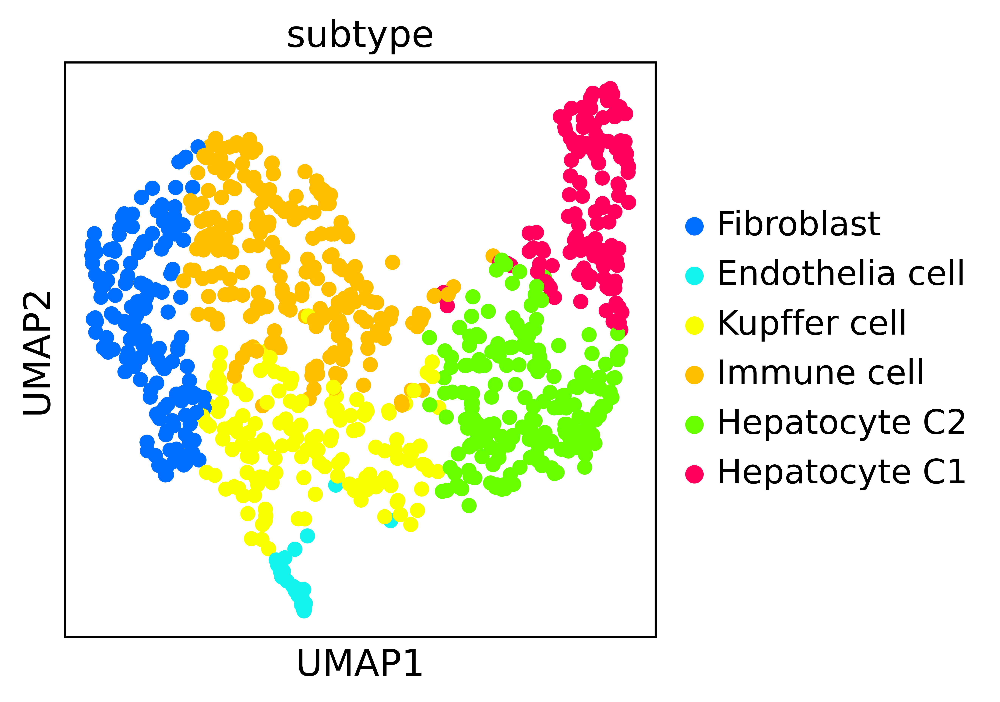

In [22]:
sc.pl.umap(a_R1,color='subtype')

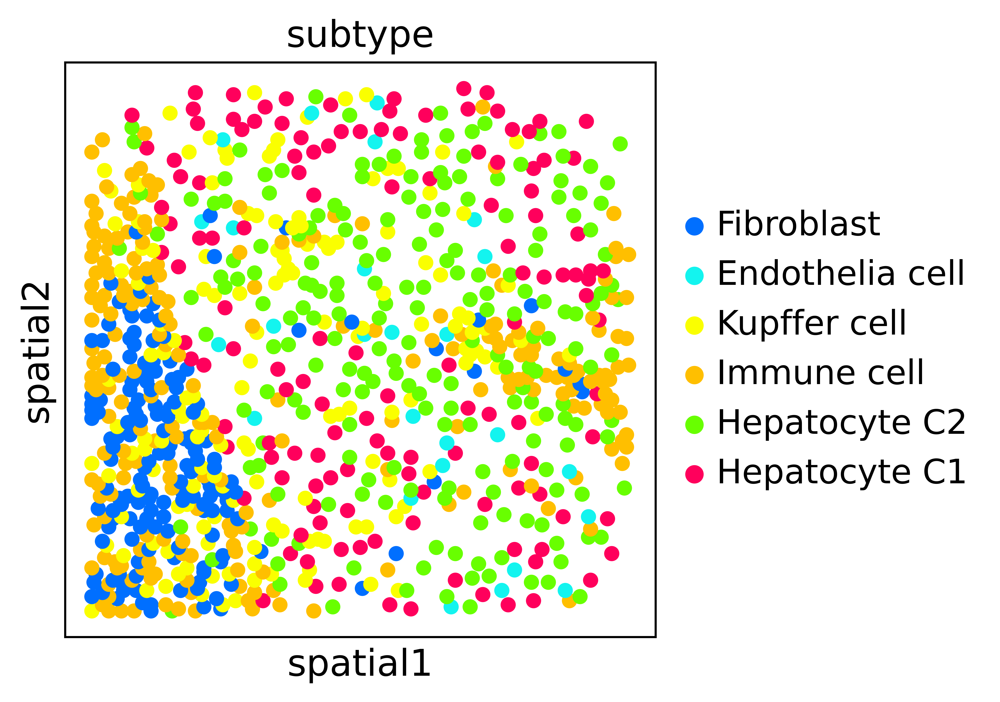

In [23]:
sc.pl.embedding(a_R1,basis='spatial',color='subtype')

In [25]:
np.unique(a_R1.obs['final_cls'])

array(['1', '2', '3', '4', '5', '6'], dtype=object)

In [30]:
a_R1.obs['type']

index
0      2
1      3
2      3
3      3
4      5
5      1
6      3
7      3
8      3
9      5
10     3
11     1
12     5
13     1
14     4
15     1
16     3
17     5
18     3
19     2
20     3
21     1
22     1
23     5
24     2
25     3
26     1
27     1
28     3
29     5
      ..
872    1
873    1
874    1
875    1
876    1
877    2
878    1
879    1
880    1
881    2
882    4
883    1
884    1
885    1
886    1
887    1
888    1
889    3
890    1
891    4
892    1
893    2
894    1
895    1
896    1
897    2
898    1
899    2
900    1
901    1
Name: type, Length: 902, dtype: object

In [35]:
R1_typename_list = ['Hepatocyte','Kupffer cell','Endothelia cell','Immune cell','Fibroblast']
R1_typeidx_list_tmp = np.array(a_R1.obs['final_cls'].copy()).astype('int')
R1_type_list = R1_typeidx_list_tmp.copy()
R1_type_list[R1_typeidx_list_tmp==5]=1
R1_type_list[R1_typeidx_list_tmp==6]=1
R1_type_list[R1_typeidx_list_tmp==3]=2
R1_type_list[R1_typeidx_list_tmp==4]=4
R1_type_list[R1_typeidx_list_tmp==1]=5
R1_type_list[R1_typeidx_list_tmp==2]=3
a_R1.obs['typeidx'] = R1_type_list.astype('str')
a_R1.obs['typeidx'] = a_R1.obs['typeidx'].astype('category')
a_R1.obs['type'] = a_R1.obs['typeidx'].copy()
a_R1.rename_categories('type', R1_typename_list)

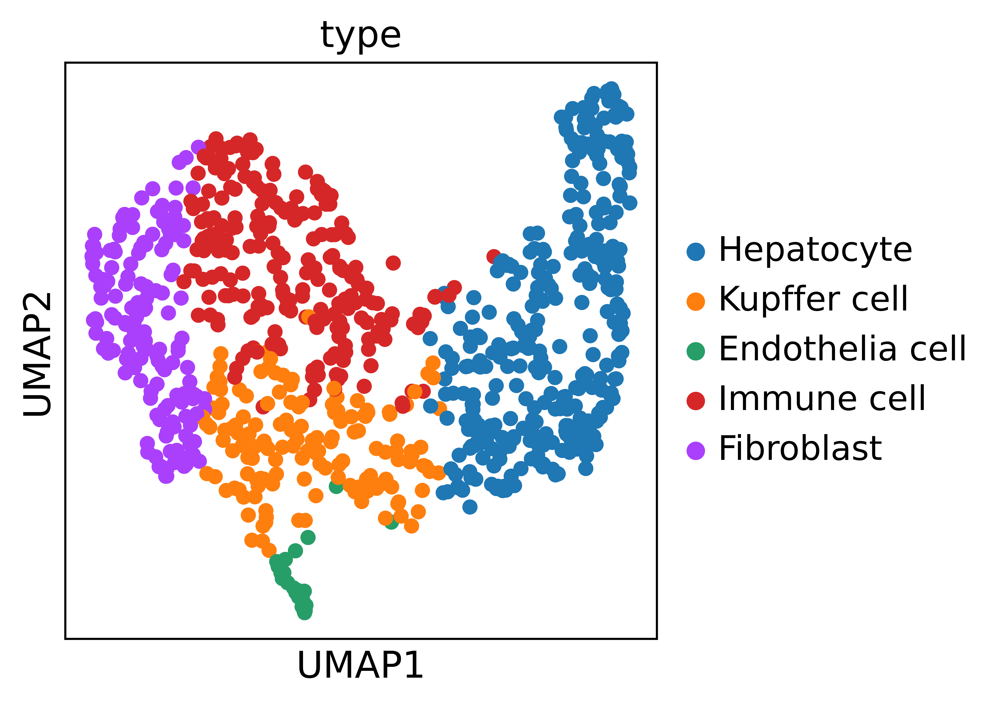

In [36]:
sc.pl.umap(a_R1,color='type')

## m ploting

In [19]:
a_m

AnnData object with n_obs × n_vars = 724 × 244 
    obs: 'pred', 'cls_8', 'cls_8_reorder', 'final_cls'
    uns: 'cls_8_colors', 'cls_8_reorder_colors', 'dendrogram_pred', 'pred_colors', 'rank_genes_groups', 'rep_list', 'final_cls_colors'
    obsm: 'X_pca', 'X_umap'

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

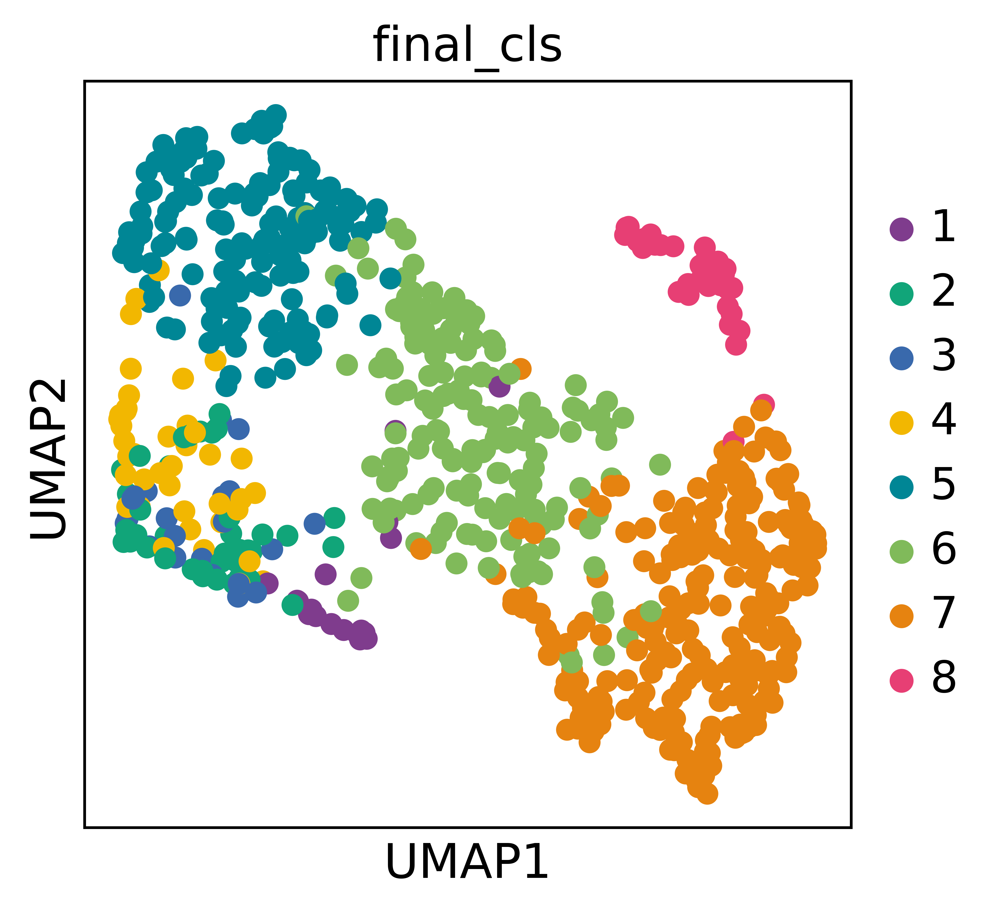

In [20]:
sc.pl.umap(a_m,color='final_cls')

In [40]:
m_typename_list = ['Hepatocyte','Kupffer cell','Endothelia cell','Other']
m_typeidx_list_tmp = np.array(a_m.obs['final_cls'].copy()).astype('int')
m_type_list = m_typeidx_list_tmp.copy()
m_type_list[m_typeidx_list_tmp==8]=1
m_type_list[m_typeidx_list_tmp==7]=1
m_type_list[m_typeidx_list_tmp==6]=1
m_type_list[m_typeidx_list_tmp==5]=1
m_type_list[m_typeidx_list_tmp==4]=2
m_type_list[m_typeidx_list_tmp==3]=3
m_type_list[m_typeidx_list_tmp==2]=3
m_type_list[m_typeidx_list_tmp==1]=4



a_m.obs['typeidx'] = m_type_list.astype('str')
a_m.obs['typeidx'] = a_m.obs['typeidx'].astype('category')
a_m.obs['type'] = a_m.obs['typeidx'].copy()
a_m.rename_categories('type', m_typename_list)

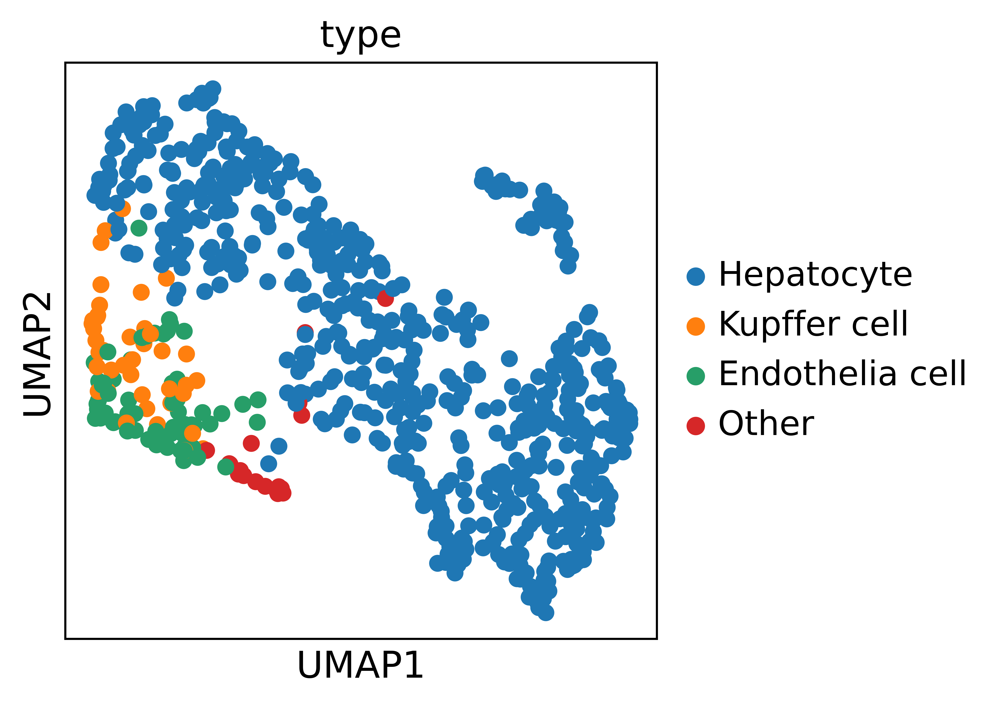

In [41]:
sc.pl.umap(a_m,color='type')

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

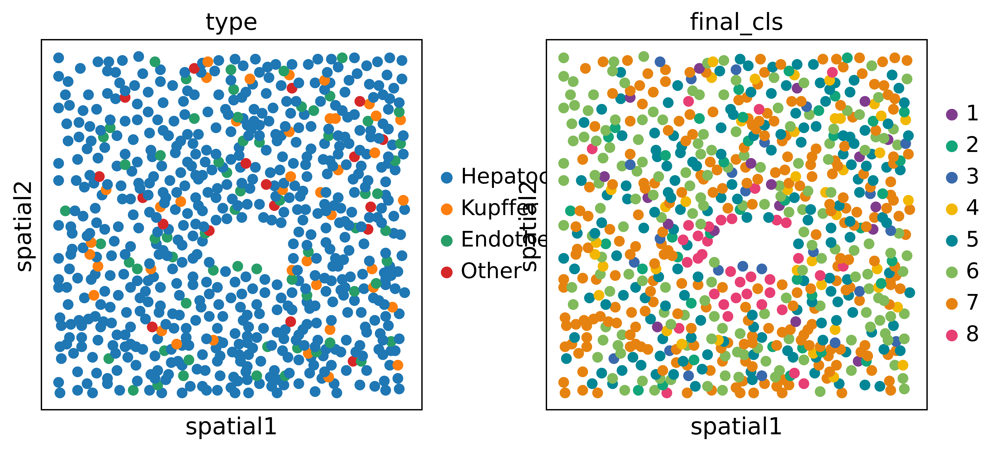

In [53]:
sc.pl.embedding(a_m,color=['type','final_cls'],basis='spatial')

# MED

In [54]:
a_m_clean = a_m[a_m.obs['type']!='Other']

In [58]:
a_m_clean.obs['Sample'] = ['mouse']* a_m_clean.shape[0]
a_R1.obs['Sample'] = ['R1']*a_R1.shape[0]

In [61]:
adata = a_R1.concatenate(a_m_clean)


In [62]:
adata

AnnData object with n_obs × n_vars = 1608 × 7 
    obs: 'Sample', 'batch', 'cls_5', 'cls_5_pca', 'cls_5_pca_reorder', 'cls_8', 'cls_8_reorder', 'fibro_dist', 'fibro_dist_mum', 'final_cls', 'pred', 'subtype', 'type', 'typeidx'
    obsm: 'X_pca', 'X_umap', 'spatial'

Trying to set attribute `.obs` of view, copying.
... storing 'Sample' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'cls_5' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'cls_5_pca' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'cls_5_pca_reorder' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'cls_8' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'cls_8_reorder' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'final_cls' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'pred' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'subtype' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'type' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'typeidx' as categorical


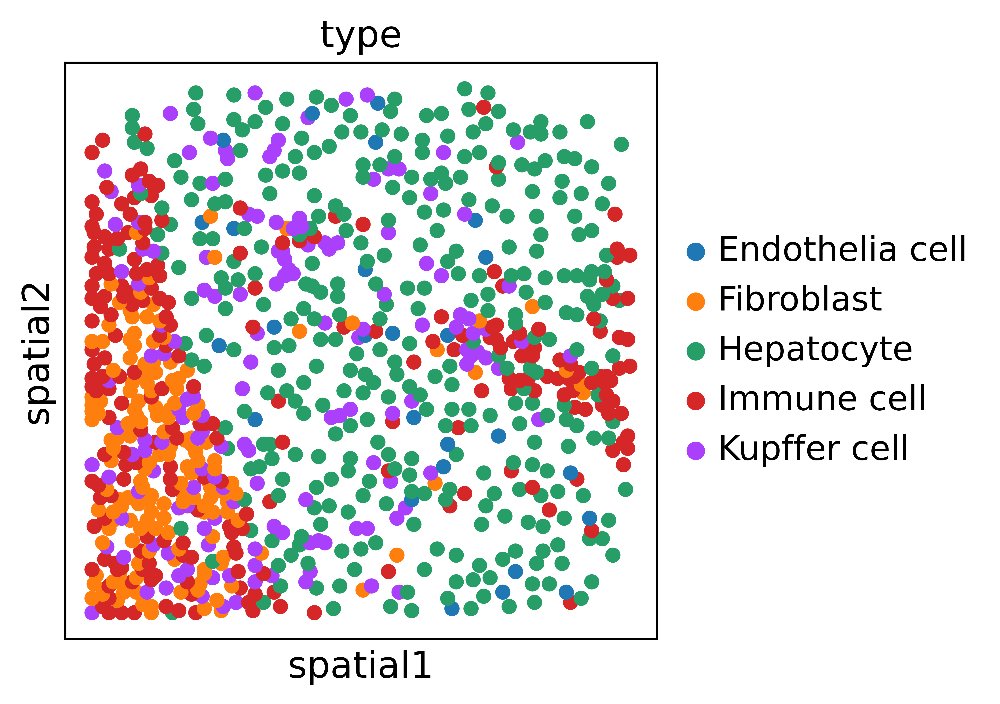

In [67]:
sc.pl.embedding(adata[adata.obs['Sample']=='R1'],basis='spatial',color='type')

In [63]:
adata = a_R1.concatenate(a_m_clean)
batch_list = np.unique(adata.obs['Sample'])
adata_list = [adata[adata.obs['Sample']==s] for s in batch_list]
a_sub_list = []
a_ME_list = []
use_cls = 'type'

ME_var_names_np = np.unique(adata_list[0].obs[use_cls])
a_ME_var_names = pd.DataFrame(index=ME_var_names_np)
adata.obsm['ME'] = np.zeros(shape=(adata.shape[0],ME_var_names_np.shape[0]))

for an in adata_list:
    cur_sample = np.array(an.obs['Sample'])
    
    cur_obs_names = pd.DataFrame(index=an.obs_names)
    cur_X = np.zeros(shape=(cur_obs_names.shape[0],a_ME_var_names.shape[0]))
    
    sc.pp.neighbors(an,use_rep='spatial',n_neighbors=8)
    a_sub_list.append(an)
    
    cur_nn_mat = an.uns['neighbors']['connectivities'].toarray()
    for i in range(cur_nn_mat.shape[0]):
        cur_row = cur_nn_mat[i,:]
        cur_row[i]=1
#         让自身也是neighbor
        cur_neighbors = np.where(cur_row!=0)
        
        cur_neighbors_cls = an[cur_neighbors].obs[use_cls]
        cur_cls_unique,cur_cls_count = np.unique(cur_neighbors_cls,return_counts=1)
        cur_cls_idx = [np.where(ME_var_names_np==c)[0][0] for c in cur_cls_unique]
        cur_X[i,cur_cls_idx] = cur_cls_count
    cur_a_ME = ad.AnnData(cur_X,  obs=cur_obs_names,var=a_ME_var_names, dtype='float32')
    cur_a_ME.obs['Sample'] = cur_sample
    cur_a_ME.obs['Sample'] = cur_a_ME.obs['Sample'].astype('category')
#     an.obsm['ME'] = cur_X
    adata.obsm['ME'][adata.obs['Sample']==cur_sample[0]] = cur_X
    a_ME_list.append(cur_a_ME)



computing neighbors
    finished (0:00:01)
computing neighbors
    finished (0:00:00)


In [73]:
np.sum(adata[adata.obs['Sample']=='mouse'].obsm['ME'],axis=0)

ArrayView([ 566.,    0., 5380.,    0.,  360.])

In [76]:
sc.pp.neighbors(adata,use_rep='ME')

computing neighbors
    finished (0:00:00)


In [77]:
sc.tl.umap(adata)

computing UMAP
    finished (0:00:11)


In [83]:
sc.tl.leiden(adata,resolution=1)

running Leiden clustering
    finished (0:00:00)


In [84]:
sc.tl.paga(adata,groups='leiden')

running PAGA
    finished (0:00:00)


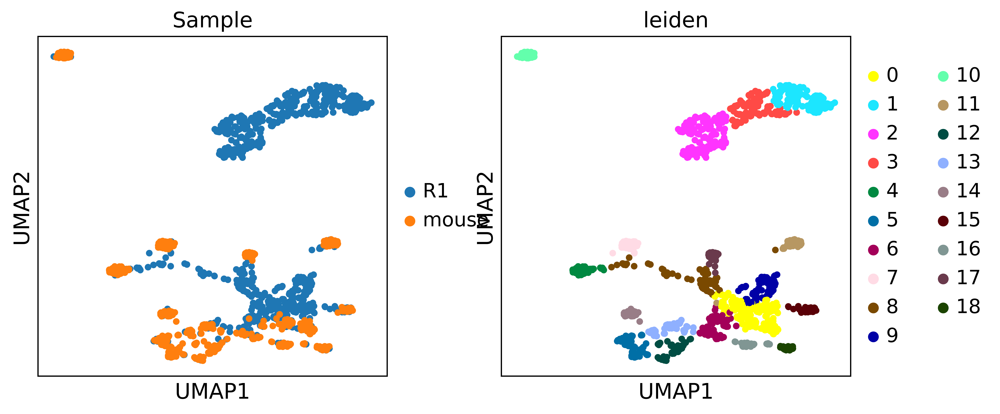

In [85]:
sc.pl.umap(adata,color=['Sample','leiden'])

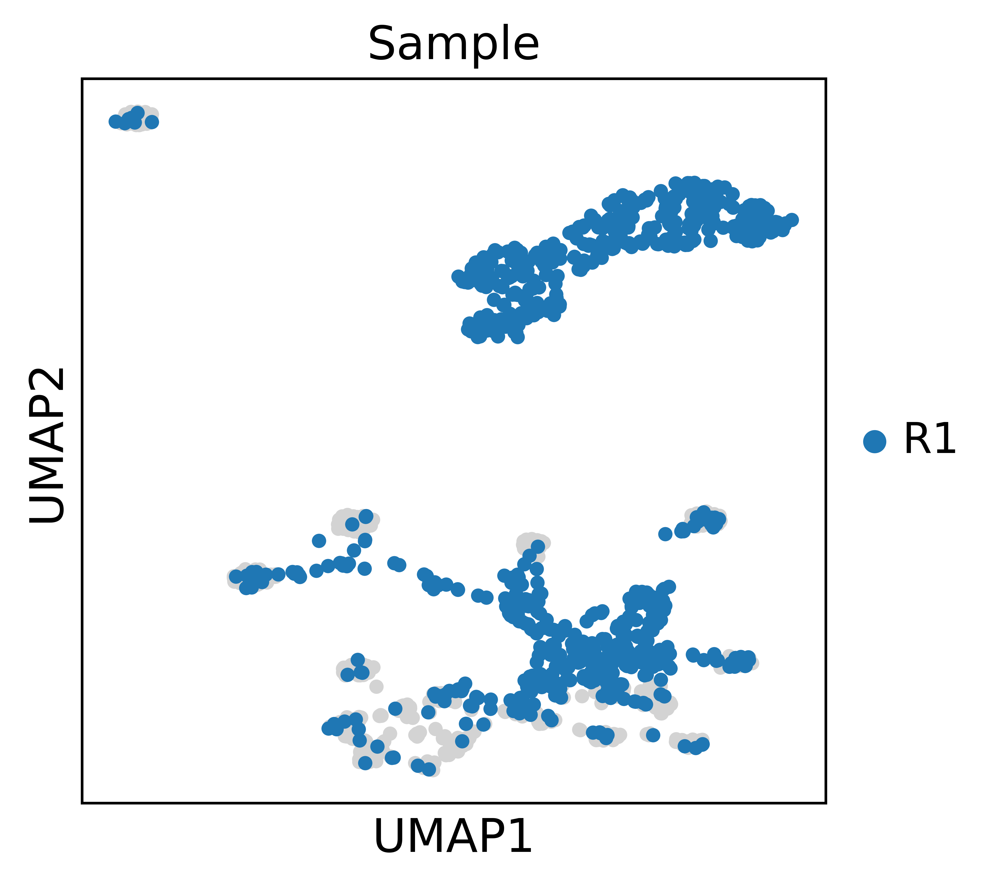

In [89]:
sc.pl.umap(adata,color=['Sample'],groups=['R1'])

In [88]:
# fig,ax = plt.subplots(1,1,figsize=(10,10))
# sc.pl.paga(adata,color=['Sample'],ax=ax)
sc.settings.figdir = 'figures/MED/'
save_paga = '_MED_SIMS.png'
sc.pl.paga(adata,color=['Sample'],save=save_paga)

# for每一个ME的cluster，看它们是否只在某一个week下出现
# 用产生随机采样的方法，test某个微环境enrich在某个week的pvalue（也就是概率小于均匀随机）
# 想办法可视化微环境
# 需要看每个week中的replicate，是否均匀分布在所有的微环境的cluster里（避免某个微环境的cluster是由于batch因素）
# 看哪些非同种细胞类型组成的ME：也就是看细胞类型的比例比较均一，如[0.5,0.5]（熵大）